In [35]:
### Import Libraries
import pandas as pd
import numpy as np
import matplotlib as plt
%matplotlib inline
import seaborn as sns
import collections
from collections import defaultdict
from ggplot import *

from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

from sklearn.mixture import GaussianMixture as GMM
from sklearn.cluster import KMeans, SpectralClustering as Spectral
from sklearn.metrics import silhouette_samples, silhouette_score

import tqdm

In [36]:
# Load Data
df = pd.DataFrame.from_csv('PositionClusters.csv')
import pickle
with open('BBallRefLineups.p', 'rb') as f:
    df2 = pickle.load(f).reset_index(drop=True)
    
with open('BBallRefLineupsPlayoffs.p', 'rb') as g:
    df3 = pickle.load(g).reset_index(drop=True)

# Select and rename columns
df2 = df2[['Season', 'League', 'Tm', 'Lineup', 'MP', 'PTS']]
df3 = df3[['Season', 'League', 'Tm', 'Lineup', 'MP', 'PTS']]
df2.columns = ['Season', 'League', 'Team', 'Possessions', 'Lineup', 'MP', 'Net_Rating']
df3.columns = ['Season', 'League', 'Team', 'Possessions', 'Lineup', 'MP', 'Net_Rating']

# Concat dataframes
df2 = pd.concat([df2, df3]).reset_index(drop=True)

# Fix Season
seasons = []
for i in df2['Season']:
    i = int(i.split('-')[0]) + 1
    seasons.append(i)
df2['Season'] = seasons
df2.head()

,Season,League,Team,Possessions,Lineup,MP,Net_Rating
0,2014,NBA Regular Season,TOR,1,[http://basketball-reference.com/players/a/aug...,1.1,500.0
1,2014,NBA Regular Season,SAS,1,[http://basketball-reference.com/players/b/bel...,0.6,300.0
2,2014,NBA Regular Season,SAS,1,[http://basketball-reference.com/players/b/bel...,0.5,300.0
3,2014,NBA Regular Season,UTA,2,[http://basketball-reference.com/players/b/bie...,1.2,300.0
4,2014,NBA Regular Season,MIA,1,[http://basketball-reference.com/players/c/cha...,0.6,300.0


In [37]:
# Create BPM Leader 
BPM_Leader = df.sort('BPM', ascending=False).groupby(['Season', 'Tm']).first().reset_index()
BPM_Leader = BPM_Leader[['Season', 'Tm', 'PLAYER_ID']]
BPM_Leader['BPM_Leader'] = 1

C:\Users\Matt\AppData\Local\Continuum\Anaconda2\lib\site-packages\ipykernel\__main__.py:2: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  from ipykernel import kernelapp as app


In [38]:
# Merge BPM leaders to data
df3 = pd.merge(df, BPM_Leader, on=['PLAYER_ID', 'Tm', 'Season'])
df = pd.concat([df3, df]).groupby(['PLAYER_ID', 'Season']).first().reset_index()

# Remove 'www.' to match urls
fixed_urls = []
for i in df['BBallRefUrl']:
    i = i.replace('www.', '')
    fixed_urls.append(i)
    
df['BBallRefUrl'] = fixed_urls

In [39]:
# Match League (playoff or regular season) to players and lineups
# Takes ~2 hours
matches = []
for j in tqdm.tqdm(range(len(df2))):
    for i in range(len(df)):
        if (df['BBallRefUrl'][i] in df2['Lineup'][j]) & (df['Season'][i] == (df2['Season'][j])):
            matches.append((df2['League'][j], j, i))
print matches            

[('NBA Regular Season', 0, 355), ('NBA Regular Season', 0, 394), ('NBA Regular Season', 0, 426), ('NBA Regular Season', 0, 576), ('NBA Regular Season', 0, 1130), ('NBA Regular Season', 1, 47), ('NBA Regular Season', 1, 493), ('NBA Regular Season', 1, 725), ('NBA Regular Season', 1, 771), ('NBA Regular Season', 1, 1051), ('NBA Regular Season', 2, 196), ('NBA Regular Season', 2, 493), ('NBA Regular Season', 2, 801), ('NBA Regular Season', 2, 1011), ('NBA Regular Season', 2, 1051), ('NBA Regular Season', 3, 284), ('NBA Regular Season', 3, 858), ('NBA Regular Season', 3, 929), ('NBA Regular Season', 3, 999), ('NBA Regular Season', 4, 142), ('NBA Regular Season', 4, 153), ('NBA Regular Season', 4, 448), ('NBA Regular Season', 4, 651), ('NBA Regular Season', 4, 1047), ('NBA Regular Season', 5, 296), ('NBA Regular Season', 5, 359), ('NBA Regular Season', 5, 828), ('NBA Regular Season', 5, 886), ('NBA Regular Season', 5, 1023), ('NBA Regular Season', 6, 169), ('NBA Regular Season', 6, 325), ('

In [40]:
# Replace with positions
name_lineups = []
position_lineups = []
for i in matches:
    league = i[0]
    lineup = i[1]
    player = i[2] 
    name = df['Name'][player]
    o_position = df['Offensive Position'][player]
    d_position = df['Defensive Position'][player]
    bpm_leader = df['BPM_Leader'][player]
    name_lineups.append((league, lineup, name))
    position_lineups.append((league, lineup, o_position, d_position, bpm_leader))

In [41]:
# Create dictionary to then count number of positions for each lineup

name_dict = defaultdict(list)
for k1, k2, v in name_lineups:
    name_dict[k2, k1].append(v)

position_dict_o = defaultdict(list)
position_dict_d = defaultdict(list)
bpm_dict = defaultdict(list)
for k1, k2, v1, v2, v3 in position_lineups:
    position_dict_o[k2, k1].append(v1)
    position_dict_d[k2, k1].append(v2)
    bpm_dict[k2, k1].append(v3)
    
# Dictionary loses place with multiple leagues, it has to be ordered
name_dict = collections.OrderedDict(sorted(name_dict.items()))
position_dict_o = collections.OrderedDict(sorted(position_dict_o.items()))
position_dict_d = collections.OrderedDict(sorted(position_dict_d.items()))
bpm_dict = collections.OrderedDict(sorted(bpm_dict.items()))

# Add player names
player_names = []
for i in name_dict:
    player_names.append(name_dict[i])
df2['PLAYER_NAMES'] = player_names

# If match, confirm its validity
valid_names = []
for i in df2['PLAYER_NAMES']:
    valid_names.append(len(i))
df2['VALID_NAMES'] = valid_names
df2.head()

# Add positions
o_positions = []
for i in position_dict_o:
    o_positions.append(position_dict_o[i])
df2['Offensive Positions'] = o_positions

d_positions = []
for i in position_dict_d:
    d_positions.append(position_dict_d[i])
df2['Defensive Positions'] = d_positions

bpm_leaders = []
for i in bpm_dict:
    bpm_leaders.append(bpm_dict[i])
df2['BPM_Leader'] = bpm_leaders

# Count positions
o_position_list_counter = []
from collections import Counter
for i in position_dict_o:
    o_position_list_counter.append(Counter(position_dict_o[i]))
    
d_position_list_counter = []
from collections import Counter
for i in position_dict_d:
    d_position_list_counter.append(Counter(position_dict_d[i]))
    
bpm_counter = []
from collections import Counter
for i in bpm_dict:
    bpm_counter.append(Counter(bpm_dict[i]))

In [42]:
# Create basic positions
basic_type = []
for i in o_position_list_counter:
    if i['Big'] >= 2:
        basic_type.append('Traditional')
    else:
        basic_type.append('Small-ball')

# Create complex positions
complex_type = []
for i in o_position_list_counter:
    if i['Big'] > 2:
        complex_type.append('Super-big')
    if i['Big'] == 2:
        complex_type.append('Traditional')
    elif i['Big'] == 1:
        complex_type.append('Small-ball')
    elif i['Big'] == 0:
        complex_type.append('Super-small')

# Create ball-handler count
ball_handlers = []
for i in o_position_list_counter:
    if i['Ball-Handler'] >= 2:
        ball_handlers.append('Multiple Ball-Handlers')
    else:
        ball_handlers.append('Single Ball-Handler')

# Check for BPM Leader
bpm_leader = []
for i in bpm_counter:
    if i[1] == 1:
        bpm_leader.append(1)
    else:
        bpm_leader.append(0)
        
df2['Basic_Type'] =  basic_type
df2['Complex_Type'] =  complex_type
df2['Ball_Handler_Type'] =  ball_handlers
df2['BPM_Leader'] = bpm_leader

# Check for having 5 valid names and 0.1 minutes played
df = df2.loc[df2['VALID_NAMES'] == 5]
df = df.loc[df['MP'] >= 0.1]

df.head()

,Season,League,Team,Possessions,Lineup,MP,Net_Rating,PLAYER_NAMES,VALID_NAMES,Offensive Positions,Defensive Positions,BPM_Leader,Basic_Type,Complex_Type,Ball_Handler_Type
0,2014,NBA Regular Season,TOR,1,[http://basketball-reference.com/players/a/aug...,1.1,500.0,"[Amir Johnson, Rudy Gay, Steve Novak, D.J. Aug...",5,"[Big, Wing, Wing, Ball-Handler, Wing]","[Interior, Forward, Forward, Guard, Forward]",0,Small-ball,Small-ball,Single Ball-Handler
1,2014,NBA Regular Season,SAS,1,[http://basketball-reference.com/players/b/bel...,0.6,300.0,"[Manu Ginobili, Marco Belinelli, Austin Daye, ...",5,"[Wing, Wing, Big, Big, Ball-Handler]","[Forward, Guard, Interior, Interior, Guard]",0,Traditional,Traditional,Single Ball-Handler
2,2014,NBA Regular Season,SAS,1,[http://basketball-reference.com/players/b/bel...,0.5,300.0,"[Matt Bonner, Marco Belinelli, Danny Green, Ka...",5,"[Big, Wing, Wing, Wing, Ball-Handler]","[Interior, Guard, Guard, Forward, Guard]",1,Small-ball,Small-ball,Single Ball-Handler
4,2014,NBA Regular Season,MIA,1,[http://basketball-reference.com/players/c/cha...,0.6,300.0,"[LeBron James, Dwyane Wade, Greg Oden, Mario C...",5,"[Ball-Handler, Wing, Big, Ball-Handler, Ball-H...","[Forward, Guard, Interior, Guard, Guard]",1,Small-ball,Small-ball,Multiple Ball-Handlers
5,2014,NBA Regular Season,WAS,1,[http://basketball-reference.com/players/g/gor...,0.6,300.0,"[Martell Webster, Marcin Gortat, John Wall, Ke...",5,"[Wing, Big, Ball-Handler, Big, Big]","[Forward, Interior, Guard, Interior, Forward]",0,Traditional,Super-big,Single Ball-Handler


In [43]:
# Save Lineup to avoid re-matching, allows for plotting in R
df.to_csv('LineupCSV.csv')
df = pd.DataFrame.from_csv('LineupCSV.csv')

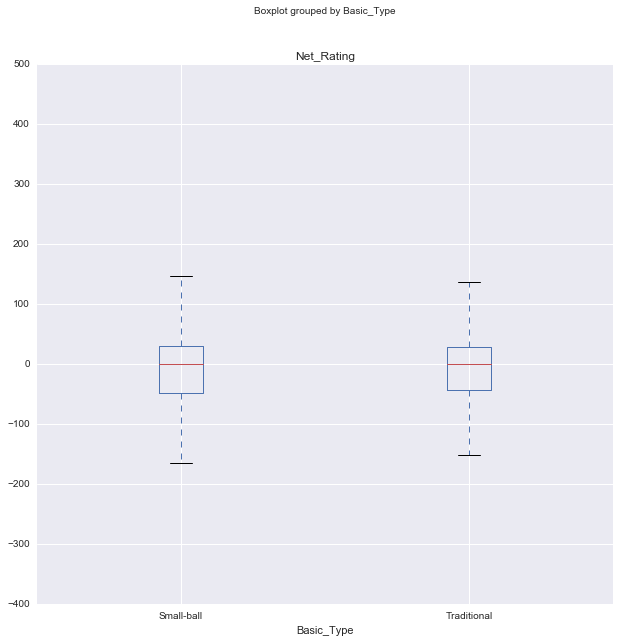

In [44]:
# With no lower limit, net rating centers at zero
df.boxplot(column='Net_Rating', by='Basic_Type', figsize=(10,10))

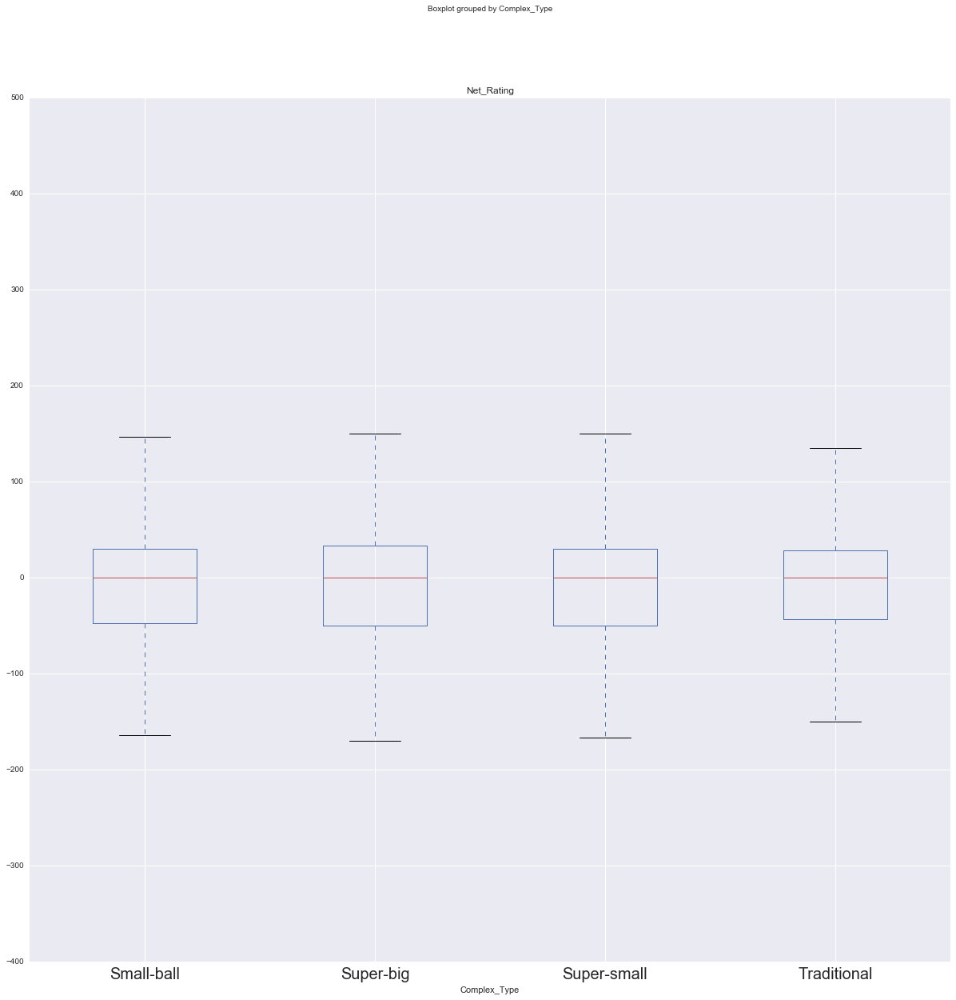

In [45]:
df.boxplot(column='Net_Rating', by='Complex_Type', figsize=(20,20), fontsize=20)

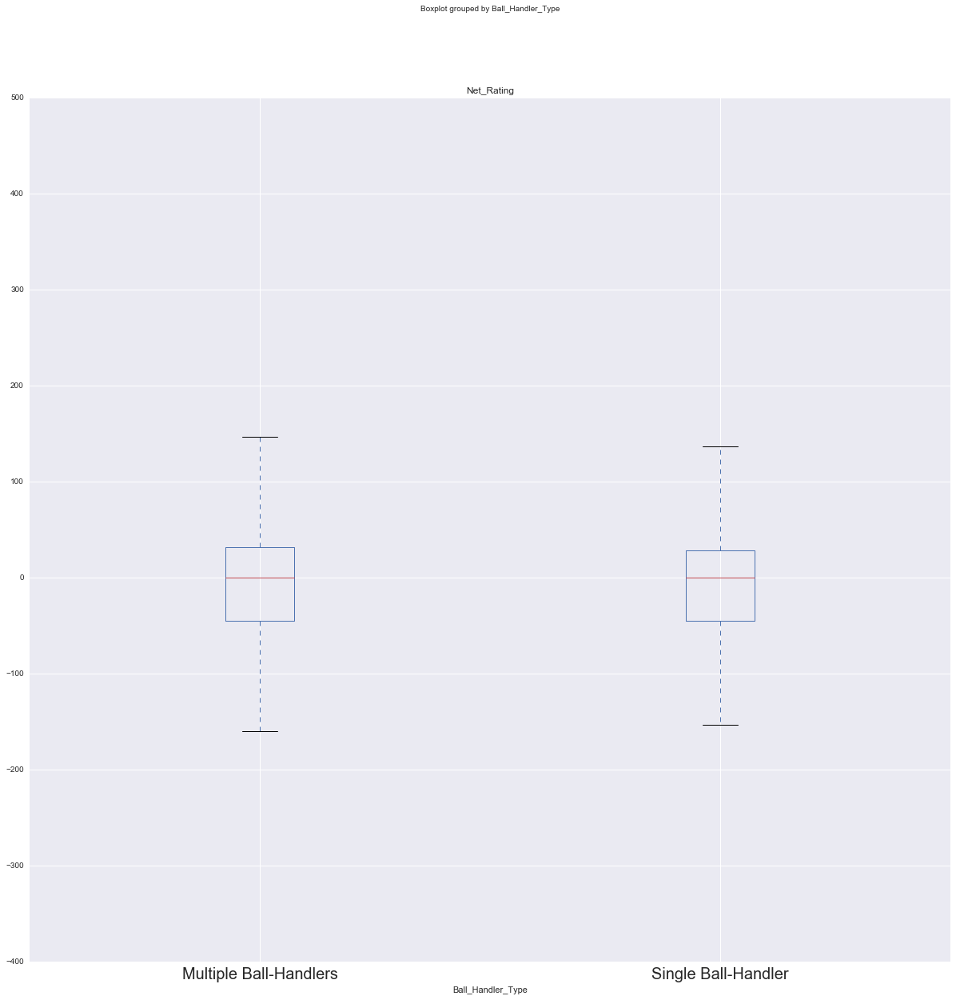

In [46]:
df.boxplot(column='Net_Rating', by='Ball_Handler_Type', figsize=(20,20), fontsize=20)

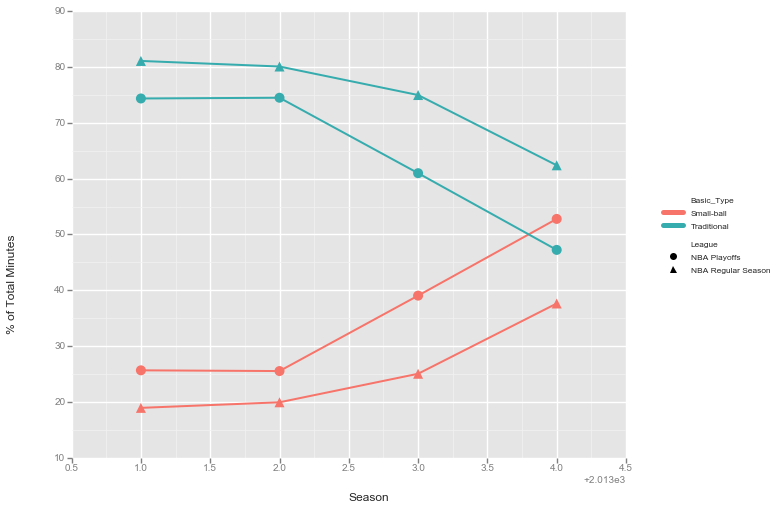

<ggplot: (39984988)>

In [53]:
# Turn into percentages
dfpct1 = df.groupby(['Season', 'League', 'Basic_Type']).agg({'MP': 'sum'})
dfpct2 = dfpct1.groupby(level=[0, 1]).apply(lambda x: 100 * x / float(x.sum()))
dfpct3 = dfpct2.reset_index()

# Possible to export formatting for plot
dfpct3.to_csv('AggregatedPercentages.csv')

# Plot each one
ggplot(aes(x='Season', y='MP', color='Basic_Type', shape='League'), data=dfpct3) +\
    geom_line(size=2) + geom_point(size=100) + scale_y_continuous(name="% of Total Minutes") +\
    scale_x_date("Season")

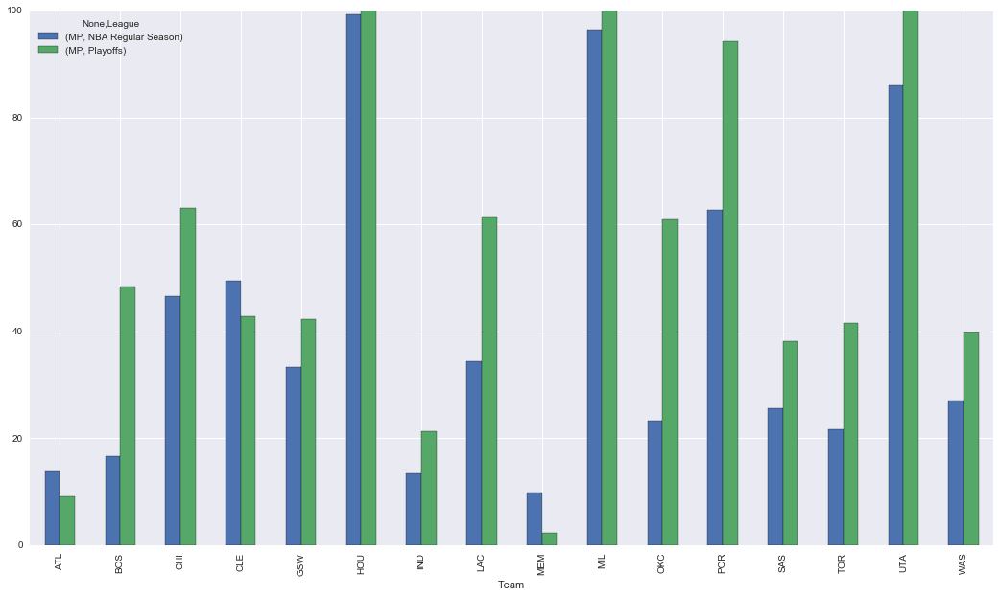

In [48]:
# Turn 2017 data into percentages
df2017 = df.loc[df['Season'] == 2017]

df2017pct1 = df2017.groupby(['Team', 'League', 'Basic_Type']).agg({'MP': 'sum'})
df2017pct2 = df2017pct1.groupby(level=[0, 1]).apply(lambda x: 100 * x / float(x.sum())).reset_index()
df2017pct3 = df2017pct2.loc[df2017pct2['Basic_Type'] == 'Small-ball']
df2017pct3 = df2017pct3.replace('NBA Playoffs', 'Playoffs')

# Sum Each Team
df_SUM_TEAM = pd.pivot_table(df2017pct3, index=['Team'], columns=['League'], values=['MP'], aggfunc=np.sum)
df_SUM_TEAM.dropna(inplace=True)
df_SUM_TEAM.plot(kind='Bar', figsize=(18,10), legend=True)

In [49]:
# Adding weights and then grouping each lineup type by team-season produces adjusted ratings
g = df.groupby(['Team', 'Season', 'Ball_Handler_Type'])

df['MINxNET'] = (df.MP * df['Net_Rating']) / (g.MP.transform("sum"))
df['ADJ_NET_BY_TEAM_SEASON'] = df.groupby(['Team', 'Season', 'Ball_Handler_Type']).MINxNET.transform('sum')

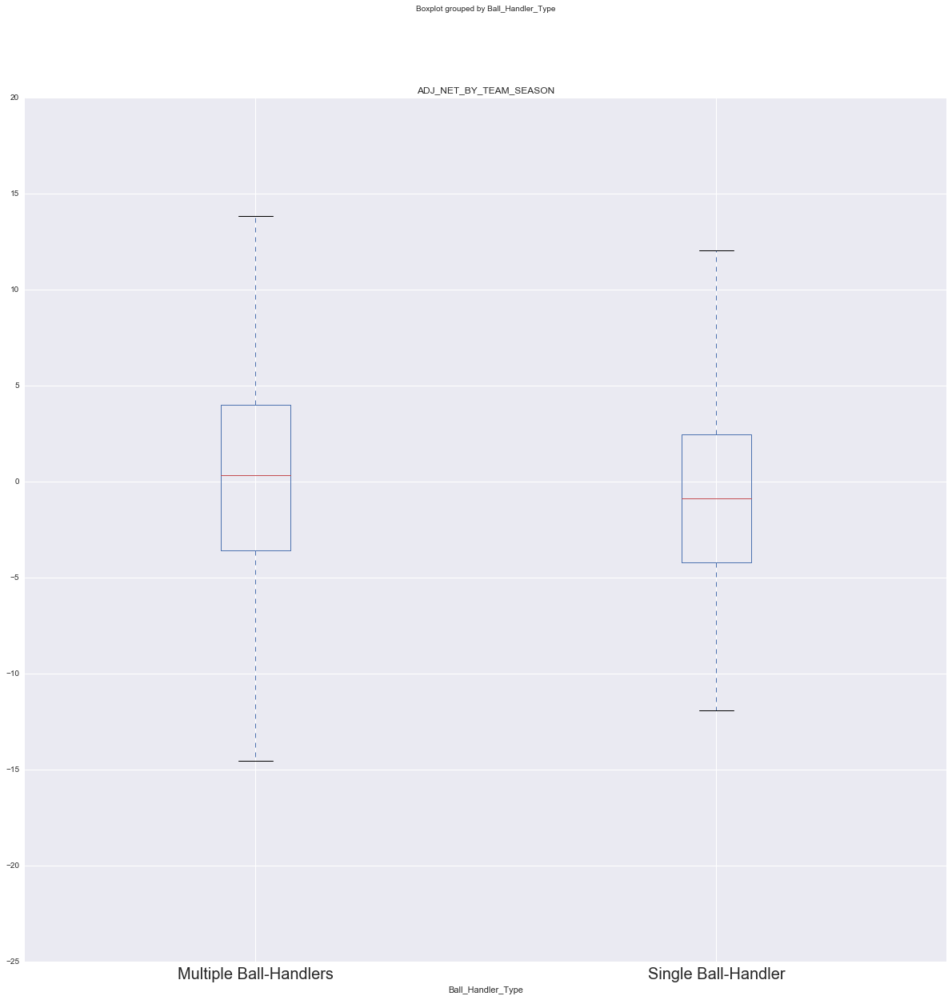

In [50]:
df.boxplot(column='ADJ_NET_BY_TEAM_SEASON', by='Ball_Handler_Type', figsize=(20,20), fontsize=20)

C:\Users\Matt\AppData\Local\Continuum\Anaconda2\lib\site-packages\ipykernel\__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\Matt\AppData\Local\Continuum\Anaconda2\lib\site-packages\ipykernel\__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


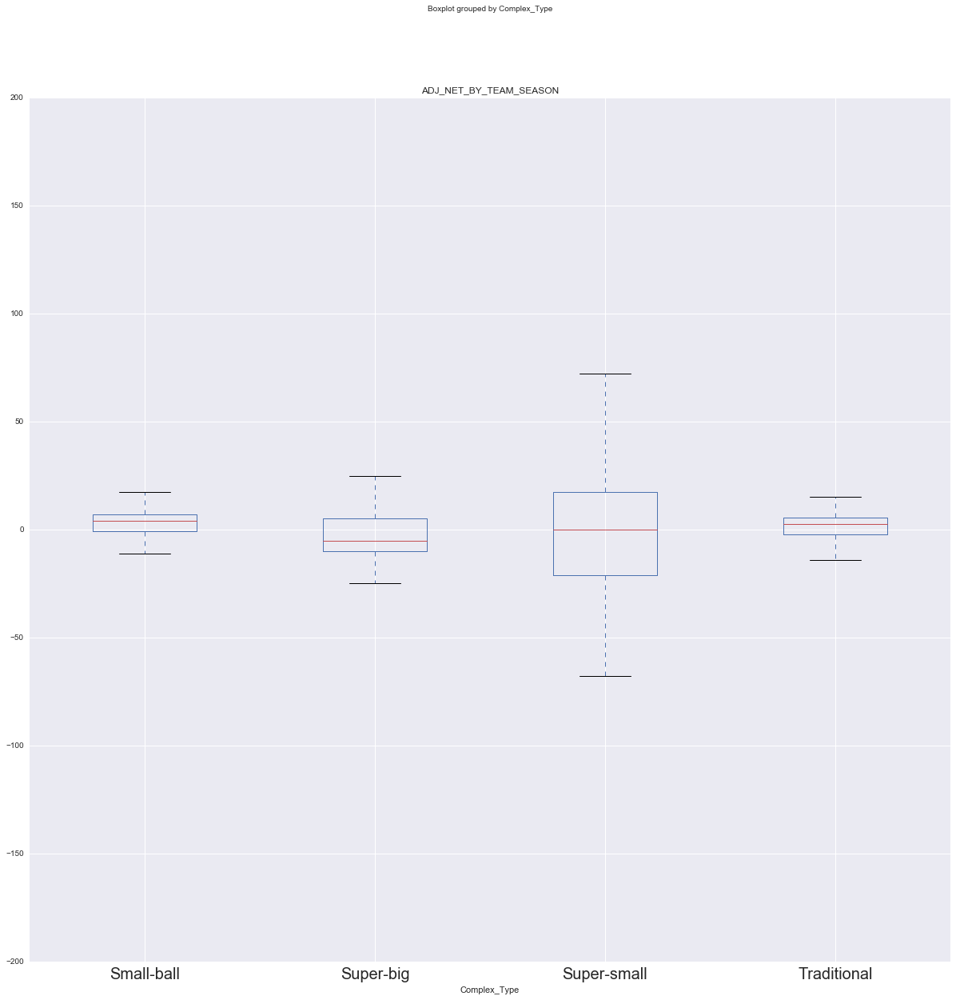

In [51]:
# Look at Complex Types for Lineups featuring BPM Leader
df_bpm = df.loc[df['BPM_Leader'] == 1]
g = df_bpm.groupby(['Team', 'Season', 'Complex_Type'])

df_bpm['MINxNET'] = (df_bpm.MP * df_bpm['Net_Rating']) / (g.MP.transform("sum"))
df_bpm['ADJ_NET_BY_TEAM_SEASON'] = df_bpm.groupby(['Team', 'Season', 'Complex_Type']).MINxNET.transform('sum')
df_bpm.boxplot(column='ADJ_NET_BY_TEAM_SEASON', by='Complex_Type', figsize=(20,20), fontsize=20)